# Predicting voters turnout for US election in 2016 using AutoML and spatial feature engineering - Part II

## Table of Contents <a class="anchor" id="0"></a>
* [Introduction](#1) 
* [Imports](#2)
* [Connecting to ArcGIS](#3)
* [Estimating Spatial Autocorrelation](#7)  
    * [Calculating Local Moran's I](#7a)
    * [Visualizing the spatial autocorrelation](#7b)
    * [Selecting highly significant spatial clustering county](#7c)
    * [Estimating distances and angle of counties from highly clustered counties](#7d)
    * [Final dataset with spatial cluster variables](#7e) 
* [Model Building](#5a)
     * [Train-Test split](#5b)
     * [Fitting a random forest model ](#5c)
     * [Data Preprocessing](#5d)
     * [Fitting Using AutoML](#5e)
     * [Model output](#5f) 
* [Voters turnout prediction & Validation](#8a)
     * [Estimate model metrics for validation](#8c)
* [Conclusion](#10)
* [Data resources](#25)    

## Introduction <a class="anchor" id="1"></a>

The objective of this notebook is to demonstrate the application of AutoML on tabular data and show the improvements that can be achieved using this method over conventional workflows. In the first part of the notebook a considerable increase was obtained and next in this notebook the result will be further enhanced using spatial feature engineering. These new features would be estimated by considering and subsequently extracting the inherent spatial pattern present in the data. 

The dataset used here is the percentage of voters turnout by county for the general election for US in 2016, which is to be predicted using the demographic characters of US counties and their socioeconomic parameters.  

## Imports <a class="anchor" id="2"></a>

In [16]:
%%time
%matplotlib inline

import matplotlib.pyplot as plt
import pandas as pd

from IPython.display import Image, HTML
from sklearn.preprocessing import MinMaxScaler,RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
from fastai.imports import *
from datetime import datetime as dt

import arcgis
from arcgis.gis import GIS
from arcgis.learn import prepare_tabulardata, AutoML, MLModel
import arcpy

Wall time: 2.99 ms


## Connecting to ArcGIS <a class="anchor" id="3"></a>

In [17]:
gis = GIS("home")

## Accessing & Visualizing datasets  <a class="anchor" id="4"></a> 

The 2016 election data is downloaded from the portal as a zipped shapefile, which is then unzipped and processed in the following.

<Item title:"VotersTurnoutCountyEelction2016" type:Shapefile owner:api_data_owner>
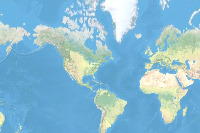

In [18]:
voter_zip = gis.content.get('650e7d6aa8fb4601a75d632a2c114425') 
voter_zip

In [19]:
import os, zipfile

In [20]:
filepath_new = voter_zip.download(file_name=voter_zip.name)
with zipfile.ZipFile(filepath_new, 'r') as zip_ref:
    zip_ref.extractall(Path(filepath_new).parent)
output_path = Path(os.path.join(os.path.splitext(filepath_new)[0]))
output_path = os.path.join(output_path,"VotersTurnoutCountyEelction2016.shp")  

In [21]:
output_path

'C:\\Users\\sup10432\\AppData\\Local\\Temp\\VotersTurnoutCountyEelction2016\\VotersTurnoutCountyEelction2016.shp'

The attribute table contains the voters turnout data by county for the entire US, which is extracted here as a pandas dataframe. The `voter_turn` field in the dataframe contains the voters turnout data in percentages for each county for the 2016 election. This will be used as the dependent variable and to be predicted using the various demographic and socioeconomic variables for each county.

In [22]:
# getting the attribute table from the shapefile which will be used for building the model
sdf_main = pd.DataFrame.spatial.from_featureclass(output_path)
sdf_main.head()

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn,gender_med,householdi,electronic,...,NNeighbors,ZTransform,SpatialLag,LMi_hi_sig,LMi_normal,Shape_Le_1,Shape_Ar_1,LMiHiDist,NEAR_FID,SHAPE
0,0,1,1,01001,Autauga,Alabama,0.613738,38.6,25553.0,4.96,...,44,0.211580,0.154568,0,0,2.496745e+05,2.208598e+09,133735.292502,0,"{""rings"": [[[-9619465, 3856529.0001000017], [-..."
1,1,1,2,01003,Baldwin,Alabama,0.627364,42.9,31429.0,4.64,...,22,0.358894,0.057952,0,0,1.642763e+06,5.671096e+09,241925.196426,3,"{""rings"": [[[-9746859, 3539643.0001000017], [-..."
2,2,1,3,01005,Barbour,Alabama,0.513816,40.2,16876.0,3.49,...,62,-0.868722,-0.498354,1,1,3.202971e+05,3.257816e+09,0.000000,0,"{""rings"": [[[-9468394, 3771591.0001000017], [-..."
3,3,1,4,01007,Bibb,Alabama,0.501364,39.3,19360.0,3.64,...,43,-1.003341,0.286440,0,0,2.279101e+05,2.311955e+09,170214.485759,7,"{""rings"": [[[-9692114, 3928124.0001000017], [-..."
4,4,1,5,01009,Blount,Alabama,0.603064,40.9,21785.0,3.86,...,51,0.096177,-0.336198,0,1,2.918753e+05,2.456919e+09,21128.568784,7,"{""rings"": [[[-9623907, 4063676.0001000017], [-..."


In [23]:
sdf_main.shape

(3112, 97)

The data is visualized here by mapping the voter turnout field into five classes. It can be seen that there is belt running along the eastern and southern part of the country representing comparatively lower voters turnout of less than 55%.   

The AutoMl significantly improves the fit compared to the standalone random forest model and the validation r square jumps to a new high. Now the previous visualization of the data revealed presence of spatial pattern in the data. Next this spatial patten is estimated and included as spatial features to improve the model further.

## Estimating Spatial Autocorrelation  <a class="anchor" id="7"></a>

This characteristics is also known as spatial autocorrelation, and is measured by the index known as Moran's I which is estimated using the `ClustersOutliers` tool available in Arcpy.

In [24]:
# First the Arcpy env is specified which will be used saving the result of the Arcpy tool
arcpy.env.workspace = output_path.replace(output_path.split('\\')[-1], "arcpy_test_env")

if os.path.exists(arcpy.env.workspace):
    shutil.rmtree(arcpy.env.workspace)

os.makedirs(arcpy.env.workspace)

In [25]:
arcpy.env.workspace

'C:\\Users\\sup10432\\AppData\\Local\\Temp\\VotersTurnoutCountyEelction2016\\arcpy_test_env'

### Calculating Local Moran's I<a class="anchor" id="7a"></a> 

The [`ClustersOutliers`](https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/cluster-and-outlier-analysis-anselin-local-moran-s.htm) will calculate the local Moran's I index for each county and identify statistically significant hot spots, cold spots, and spatial outliers. It takes as input the shapefile having the data, field name for which the clustering is to be estimated, output name of the shapefile etc. and outputs Moran's I value, a z-score, a pseudo p-value, and a code representing the cluster type for each statistically significant feature. The z-scores and pseudo p-values represent the statistical significance of the computed index values.  

In [27]:
arcpy.env.workspace = arcpy.env.workspace 
output_path = output_path 

In [29]:
result = arcpy.stats.ClustersOutliers(output_path,
                                      "voter_turn", "voters_turnout_ClusterOutlier.shp",
                                     'INVERSE_DISTANCE',
                                     'EUCLIDEAN_DISTANCE','ROW', "#", "#","NO_FDR", 499)

In [30]:
result[0]

'C:\\Users\\sup10432\\AppData\\Local\\Temp\\VotersTurnoutCountyEelction2016\\arcpy_test_env\\voters_turnout_ClusterOutlier.shp'

In [31]:
# accessing the attribute table from the output shapefile
sdf_main_LMi = pd.DataFrame.spatial.from_featureclass(result[0])
sdf_main_LMi.head()

,FID,SOURCE_ID,voter_turn,LMiIndex,LMiZScore,LMiPValue,COType,NNeighbors,ZTransform,SpatialLag,SHAPE
0,0,0,0.613738,0.032693,0.977488,0.178,,44,0.211580,0.154568,"{""rings"": [[[-9619465, 3856529.0001000017], [-..."
1,1,1,0.627364,0.020792,0.176791,0.426,,22,0.358894,0.057952,"{""rings"": [[[-9746859, 3539643.0001000017], [-..."
2,2,2,0.513816,0.432791,3.654596,0.002,LL,62,-0.868722,-0.498354,"{""rings"": [[[-9468394, 3771591.0001000017], [-..."
3,3,3,0.501364,-0.287305,-1.909715,0.030,LH,43,-1.003341,0.286440,"{""rings"": [[[-9692114, 3928124.0001000017], [-..."
4,4,4,0.603064,-0.032324,-2.328254,0.020,HL,51,0.096177,-0.336198,"{""rings"": [[[-9623907, 4063676.0001000017], [-..."


### Visualizing the spatial autocorrelation<a class="anchor" id="7b"></a>

The COType field in the Output Feature Class will be HH for a statistically significant cluster of high values and LL for a statistically significant cluster of low values. The COType field in the Output Feature Class will indicate if the feature has a high value and is surrounded by features with low values (HL) or if the feature has a low value and is surrounded by features with high values (LH). This is visualized in the map below: 


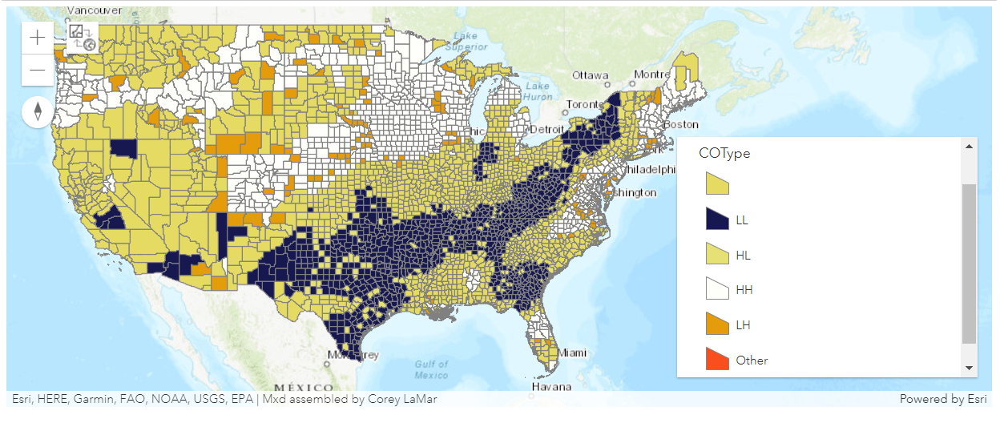

In [71]:
# visualizing spatial autocorrelation in voters turnout
m2= GIS().map('United States', zoomlevel=4)
sdf_main_LMi.spatial.plot(map_widget = m2, renderer_type='u', col='COType', line_width=0.5)
m2.legend=True
m2

The black pixels in the map above shows that there is spatial clustering of low voters turnout along the eastern coast, while the white pixels in the north eastern, central and north western portion of the country indicates areas of spatial clustering of high voters turnout. 

To include this as spatial features the counties with the most significant or the lowest p-value will be identified followed by measuring the distance and the angle or direction of each county from the those lowest-p value county. These two variables namely the distance and the angle are included as the new spatial features in the model.

In [33]:
# checking the field names having the p values
sdf_main_LMi.columns

Index(['FID', 'SOURCE_ID', 'voter_turn', 'LMiIndex', 'LMiZScore', 'LMiPValue',
       'COType', 'NNeighbors', 'ZTransform', 'SpatialLag', 'SHAPE'],
      dtype='object')

### Selecting highly significant spatial clustering county <a class="anchor" id="7c"></a>

The most significant or the lowest p-value here is 0.002, and all counties with this p values are selected, and a field is created, which will be used to create a shapefile containing all these highly significant counties. Another field is created for counties having p-values less than or equal to 0.05, indicating all the significant clustering counties, which will be used as the third spatial feature in the final model.

In [34]:
# creating new fields with highly significant clustering counties
sdf_main_LMi['LMi_hi_sig<.002'] =  np.where(sdf_main_LMi['LMiPValue']<=.002, 1,0)
sdf_main_LMi['LMi_sig_<0.05'] =  np.where(sdf_main_LMi['LMiPValue']<=.05, 1,0)
sdf_main_LMi.head()

,FID,SOURCE_ID,voter_turn,LMiIndex,LMiZScore,LMiPValue,COType,NNeighbors,ZTransform,SpatialLag,SHAPE,LMi_hi_sig<.002,LMi_sig_<0.05
0,0,0,0.613738,0.032693,0.977488,0.178,,44,0.211580,0.154568,"{""rings"": [[[-9619465, 3856529.0001000017], [-...",0,0
1,1,1,0.627364,0.020792,0.176791,0.426,,22,0.358894,0.057952,"{""rings"": [[[-9746859, 3539643.0001000017], [-...",0,0
2,2,2,0.513816,0.432791,3.654596,0.002,LL,62,-0.868722,-0.498354,"{""rings"": [[[-9468394, 3771591.0001000017], [-...",1,1
3,3,3,0.501364,-0.287305,-1.909715,0.030,LH,43,-1.003341,0.286440,"{""rings"": [[[-9692114, 3928124.0001000017], [-...",0,1
4,4,4,0.603064,-0.032324,-2.328254,0.020,HL,51,0.096177,-0.336198,"{""rings"": [[[-9623907, 4063676.0001000017], [-...",0,1


In [35]:
sdf_main_LMi.shape

(3112, 13)

In [36]:
# create new dataframe for LMi_hi_sig<.002 
LMi_hi_sig_county_main = sdf_main_LMi[sdf_main_LMi['LMi_hi_sig<.002']==1].copy()

In [37]:
LMi_hi_sig_county_main.shape

(1134, 13)

In [38]:
# creating a new shapefile for the most significant clustering counties from spatial dataframe 
near_dist_from_main_county = sdf_main_LMi.spatial.to_featureclass('voters_turnout_train_LMi'+str(dt.now().microsecond))
near_dist_to_hi_sig_county = LMi_hi_sig_county_main.spatial.to_featureclass('LMi_hi_sig_county_train'+str(dt.now().microsecond))

In [39]:
near_dist_from_main_county

'C:\\Users\\sup10432\\desktop notebooks\\voters_turnout_train_LMi42162.shp'

### Estimating distances and angle of counties from highly clustered counties<a class="anchor" id="7d"></a>

The [`Near`(Analysis)](https://pro.arcgis.com/en/pro-app/latest/tool-reference/analysis/near.htm) tool from Arcpy is used to calculate the distance and the angle of all the counties from the highly significant clustering counties. It takes as input first the high significant counties from which the distance is to be estimated followed by the shapefile having all the counties, to which the distance and the angle is calculated.  

In [40]:
# Using the Near tool to calculate distance and angle
dist_to_nearest_hi_sig = arcpy.analysis.Near(near_dist_from_main_county,near_dist_to_hi_sig_county,'#','#','ANGLE','GEODESIC')

In [41]:
dist_to_nearest_hi_sig[0]

'C:\\Users\\sup10432\\desktop notebooks\\voters_turnout_train_LMi42162.shp'

In [42]:
# Accessing the attribute table from the resulting shapefile
sdf_nearest_hi_sig = pd.DataFrame.spatial.from_featureclass(dist_to_nearest_hi_sig[0])
sdf_nearest_hi_sig.head()

,FID,Id,source_id,voter_turn,l_mi_index,l_mi_z_sco,l_mi_p_val,co_type,n_neighbor,z_transfor,spatial_la,l_mi_hi_si,l_mi_sig_0,NEAR_FID,NEAR_DIST,NEAR_ANGLE,SHAPE
0,0,0,0,0.613738,0.032693,0.0,0.0,,0,0.0,0.0,0,0,6,67162.144028,89.803930,"{""rings"": [[[-9619465, 3856529.0001000017], [-..."
1,1,0,1,0.627364,0.020792,0.0,0.0,,0,0.0,0.0,0,0,0,182315.087799,76.372022,"{""rings"": [[[-9746859, 3539643.0001000017], [-..."
2,2,0,2,0.513816,0.432791,0.0,0.0,LL,0,0.0,0.0,0,0,0,0.000000,0.000000,"{""rings"": [[[-9468394, 3771591.0001000017], [-..."
3,3,0,3,0.501364,-0.287305,0.0,0.0,LH,0,0.0,0.0,0,0,6,111571.054693,97.612838,"{""rings"": [[[-9692114, 3928124.0001000017], [-..."
4,4,0,4,0.603064,-0.032324,0.0,0.0,HL,0,0.0,0.0,0,0,9,0.000000,0.000000,"{""rings"": [[[-9623907, 4063676.0001000017], [-..."


In the above resulting dataframe the field namely `NEAR_DIST` and `NEAR_ANGLE` ( third and the second field from the last) gives the desired distance and angle of the counties from the highly significant clustering counties, while the field named `l_mi_sig_0`, indicates all the significant counties and all three will be used as the spatial predictors in the final model. 

In [43]:
sdf_nearest_hi_sig.shape

(3112, 17)

In [44]:
sdf_main.shape

(3112, 97)

In [45]:
sdf_main.head(2)

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn,gender_med,householdi,electronic,...,NNeighbors,ZTransform,SpatialLag,LMi_hi_sig,LMi_normal,Shape_Le_1,Shape_Ar_1,LMiHiDist,NEAR_FID,SHAPE
0,0,1,1,01001,Autauga,Alabama,0.613738,38.6,25553.0,4.96,...,44,0.211580,0.154568,0,0,2.496745e+05,2.208598e+09,133735.292502,0,"{""rings"": [[[-9619465, 3856529.0001000017], [-..."
1,1,1,2,01003,Baldwin,Alabama,0.627364,42.9,31429.0,4.64,...,22,0.358894,0.057952,0,0,1.642763e+06,5.671096e+09,241925.196426,3,"{""rings"": [[[-9746859, 3539643.0001000017], [-..."


In [46]:
# dropping the existing p-values estimated columns from the main table to be replaced by the newly calculated values
sdf_main_final = sdf_main.drop(['SOURCE_ID', 'voter_tu_1',
       'Shape_Leng', 'Shape_Area', 'LMiIndex', 'LMiZScore', 'LMiPValue',
       'COType', 'NNeighbors', 'ZTransform', 'SpatialLag', 'LMi_hi_sig',
       'LMi_normal', 'NEAR_FID', 'Shape_Le_1', 'Shape_Ar_1', 'LMiHiDist',  'SHAPE'], axis=1)

In [47]:
sdf_main_final.head(2)

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn,gender_med,householdi,electronic,...,City9Dist,City9Ang,City8Dist,City8Ang,City7Dist,City7Ang,City6Dist,City6Ang,City5Dist,City5Ang
0,0,1,1,01001,Autauga,Alabama,0.613738,38.6,25553.0,4.96,...,383948.84777,-0.847576,10748.108812,109.277531,76082.644216,-6.321051,0.0,0.0,358644.11945,-74.872116
1,1,1,2,01003,Baldwin,Alabama,0.627364,42.9,31429.0,4.64,...,472377.29045,-25.580055,4252.349631,-85.916425,17821.080946,94.801172,0.0,0.0,356543.92578,-44.723872


### Final dataset with spatial cluster variables <a class="anchor" id="7e"></a>

In [48]:
# joining the newly calculated spatial features with the main dataset 
sdf_main_final_merged = sdf_main_final.merge(sdf_nearest_hi_sig, on='FID', how='inner')

In [49]:
# checking the final merged data
sdf_main_final_merged.head(2)

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn_x,gender_med,householdi,electronic,...,co_type,n_neighbor,z_transfor,spatial_la,l_mi_hi_si,l_mi_sig_0,NEAR_FID,NEAR_DIST,NEAR_ANGLE,SHAPE
0,0,1,1,01001,Autauga,Alabama,0.613738,38.6,25553.0,4.96,...,,0,0.0,0.0,0,0,6,67162.144028,89.803930,"{'rings': [[[-9619465, 3856529.0001000017], [-..."
1,1,1,2,01003,Baldwin,Alabama,0.627364,42.9,31429.0,4.64,...,,0,0.0,0.0,0,0,0,182315.087799,76.372022,"{'rings': [[[-9746859, 3539643.0001000017], [-..."


## Model Building <a class="anchor" id="5a"></a>

Now the new dataset prepared having the new spatial variables are used to fit the AutoML model to see for improvements, following the earlier mentioned steps.

## Train-Test split<a class="anchor" id="5b"></a>

The dataset with 3112 samples is split into training and test datasets, in a 90 to 10 ratio.

In [50]:
# Splitting data with test size of 10% data for validation 
test_size = .10
sdf_train, sdf_test = train_test_split(sdf_main_final_merged, test_size = test_size, random_state=32)

In [51]:
# checking train-test split
print(sdf_train.shape)
print(sdf_test.shape)

(2800, 95)
(312, 95)


In [52]:
sdf_train.head(2)

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn_x,gender_med,householdi,electronic,...,co_type,n_neighbor,z_transfor,spatial_la,l_mi_hi_si,l_mi_sig_0,NEAR_FID,NEAR_DIST,NEAR_ANGLE,SHAPE
2244,2244,1,2245,42061,Huntingdon,Pennsylvania,0.534472,43.0,23471.0,3.73,...,,0,0.0,0.0,0,0,683,29710.796836,29.303288,"{'rings': [[[-8647447, 4972564.000100002], [-8..."
2710,2710,1,2711,48435,Sutton,Texas,0.547776,39.3,31334.0,3.77,...,,0,0.0,0.0,0,0,873,41735.520773,-1.056234,"{'rings': [[[-11144914, 3540920.0001000017], [..."


### Data Preprocessing <a class="anchor" id="5d"></a>

Here X is the list of explanatory variables chosen from the new feature data that will be used for predicting voters turnout. The new spatial clusters features used here are `NEAR_DIST`, `NEAR_ANGLE`,`l_mi_sig_0` as explained in the previous section. Some more spatial features were included to account for the direction of the counties in terms of angle of the counties from various grades of cities that were precalculated, which are `City10Ang`, `City9Ang`,`City8Ang` etc.     

Also, the categorical variables are marked with a True value inside a tuple. The scaler is defined in the preprocessors.

In [53]:
#listing explanatory variables
X =[('county',True), ('state',True),'gender_med', 'householdi', 'electronic', 'raceandhis',
       ('voter_laws',True), 'educationa', 'educatio_1', 'educatio_2', 'educatio_3',
       'maritalsta', 'F5yearincr', 'F5yearin_1', 'F5yearin_2', 'F5yearin_3',
       'F5yearin_4', 'F5yearin_5', 'F5yearin_6', 'language_a', 'hispanicor',
       'hispanic_1', 'raceandh_1', 'atrisk_avg', 'disposable', 'disposab_1',
       'disposab_2', 'disposab_3', 'disposab_4', 'disposab_5', 'disposab_6',
       'disposab_7', 'disposab_8', 'disposab_9', 'disposa_10', 'househol_1',
       'househol_2', 'househol_3', 'househol_4', 'househol_5', 'househol_6',
       'househol_7', 'househol_8', 'househol_9', 'language_1', 'language_2',
       'households', 'househo_10', 'educatio_4', 'educatio_5', 'educatio_6',
       'educatio_7', 'psychograp', 'psychogr_1', 'financial_', 'financial1',
       'financia_1', 'miscellane', 'state_vote', 'state_vo_1',
        'City10Ang', 'City9Dist', 'City9Ang',
       'City8Dist', 'City8Ang', 'City7Dist', 'City7Ang', 'City6Dist',
       'City6Ang', 'City5Dist', 'City5Ang', 'l_mi_sig_0', 'NEAR_DIST', 'NEAR_ANGLE']

In [54]:
# defining the preprocessors for scaling data
preprocessors = [('county', 'state','gender_med', 'householdi', 'electronic', 'raceandhis',
       'voter_laws', 'educationa', 'educatio_1', 'educatio_2', 'educatio_3',
       'maritalsta', 'F5yearincr', 'F5yearin_1', 'F5yearin_2', 'F5yearin_3',
       'F5yearin_4', 'F5yearin_5', 'F5yearin_6', 'language_a', 'hispanicor',
       'hispanic_1', 'raceandh_1', 'atrisk_avg', 'disposable', 'disposab_1',
       'disposab_2', 'disposab_3', 'disposab_4', 'disposab_5', 'disposab_6',
       'disposab_7', 'disposab_8', 'disposab_9', 'disposa_10', 'househol_1',
       'househol_2', 'househol_3', 'househol_4', 'househol_5', 'househol_6',
       'househol_7', 'househol_8', 'househol_9', 'language_1', 'language_2',
       'households', 'househo_10', 'educatio_4', 'educatio_5', 'educatio_6',
       'educatio_7', 'psychograp', 'psychogr_1', 'financial_', 'financial1',
       'financia_1', 'miscellane', 'state_vote', 'state_vo_1',
        'City10Ang', 'City9Dist', 'City9Ang',
       'City8Dist', 'City8Ang', 'City7Dist', 'City7Ang', 'City6Dist',
       'City6Ang', 'City5Dist', 'City5Ang', 'l_mi_sig_0', 'NEAR_DIST', 'NEAR_ANGLE', MinMaxScaler())]

In [55]:
# preparing data for the model
data = prepare_tabulardata(sdf_train,
                           variable_predict='voter_turn_x',
                           explanatory_variables=X, 
                           preprocessors=preprocessors)

C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\arcgis\learn\_utils\tabular_data.py:1035: UserWarning:

Column county has more than 20 unique value. Sure this is categorical?

C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\arcgis\learn\_utils\tabular_data.py:1035: UserWarning:

Column state has more than 20 unique value. Sure this is categorical?



## Fitting a random forest model  <a class="anchor" id="5c"></a> 


First a random forest model is fitted to the new spatial data. 

### Model Initialization <a class="anchor" id="12"></a>

The MLModel is initialized with the Random Forest model from Sklearn along with its model parameters.

In [56]:
# defining the model along with the parameters 
model = MLModel(data, 'sklearn.ensemble.RandomForestRegressor', n_estimators=500, random_state=43)

In [57]:
model.fit()

In [58]:
model.score()

0.7365013989897565

In [59]:
# validating trained model on test dataset
voter_county_mlmodel_predicted = model.predict(sdf_test, prediction_type='dataframe')

In [60]:
voter_county_mlmodel_predicted.head(2)

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn_x,gender_med,householdi,electronic,...,n_neighbor,z_transfor,spatial_la,l_mi_hi_si,l_mi_sig_0,NEAR_FID,NEAR_DIST,NEAR_ANGLE,SHAPE,prediction_results
115,115,1,116,05067,Jackson,Arkansas,0.371336,41.8,17956.0,3.33,...,0,0.0,0.0,0,0,24,0.0,0.0,"{'rings': [[[-10133692, 4284820.000100002], [-...",0.471754
1529,1529,1,1530,29153,Ozark,Missouri,0.591207,51.4,18827.0,3.92,...,0,0.0,0.0,0,0,33,0.0,0.0,"{'rings': [[[-10253900, 4410465.000100002], [-...",0.549079


In [62]:
# calculating validation model score
r_square_voter_county_mlmodel_Test = metrics.r2_score(voter_county_mlmodel_predicted['voter_turn_x'], voter_county_mlmodel_predicted['prediction_results']) 
print('r_square_voter_county_mlmodel_Test: ', round(r_square_voter_county_mlmodel_Test,2))

r_square_voter_county_mlmodel_Test:  0.79


The validation r square for the random forest model is satisfactory, and now AutoML will be used to improve it.

## Fitting Using AutoML  <a class="anchor" id="6"></a>  <a class="anchor" id="5e"></a>

The same data obtained using the prepare_taular data function is used as input for the AutoML model. Here the model is initialized using the `Compete` mode which is its maximum performance option out of the various modes. 

In [63]:
# initializing AutoML model with the Compete mode 
AutoML_voters_county_obj_compete = AutoML(data, eval_metric='r2', mode='Compete')

In [64]:
# training the AutoML model
AutoML_voters_county_obj_compete.fit()

AutoML directory: AutoML_16
The task is regression with evaluation metric r2
AutoML will use algorithms: ['Linear', 'Decision Tree', 'Random Forest', 'Extra Trees', 'LightGBM', 'Xgboost', 'Neural Network']
AutoML will stack models
AutoML will ensemble availabe models
AutoML steps: ['adjust_validation', 'simple_algorithms', 'default_algorithms', 'not_so_random', 'kmeans_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'boost_on_errors', 'ensemble', 'stack', 'ensemble_stacked']
* Step adjust_validation will try to check up to 1 model


2021-09-17 09:07:32,813 concurrent.futures ERROR exception calling callback for <Future at 0x28dc43349c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
1_DecisionTree r2 0.46705 trained in 19.84 seconds
Disable stacking for split validation
* Step simple_algorithms will try to check up to 3 models


2021-09-17 09:07:53,341 concurrent.futures ERROR exception calling callback for <Future at 0x28debe57308 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
2_DecisionTree r2 0.498881 trained in 23.76 seconds


2021-09-17 09:08:16,341 concurrent.futures ERROR exception calling callback for <Future at 0x28ded558ec8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
3_DecisionTree r2 0.498881 trained in 19.86 seconds


2021-09-17 09:08:37,503 concurrent.futures ERROR exception calling callback for <Future at 0x28df7a43588 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
4_Linear r2 0.713465 trained in 17.84 seconds
* Step default_algorithms will try to check up to 5 models


2021-09-17 09:09:01,041 concurrent.futures ERROR exception calling callback for <Future at 0x28df8374bc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
5_Default_LightGBM r2 0.792077 trained in 21.63 seconds


2021-09-17 09:09:33,113 concurrent.futures ERROR exception calling callback for <Future at 0x28df92e7448 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
6_Default_Xgboost r2 0.783247 trained in 31.53 seconds


2021-09-17 09:09:51,161 concurrent.futures ERROR exception calling callback for <Future at 0x28df9c7a848 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
7_Default_NeuralNetwork r2 0.687876 trained in 19.98 seconds


2021-09-17 09:10:13,144 concurrent.futures ERROR exception calling callback for <Future at 0x28dff23d248 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
8_Default_RandomForest r2 0.651527 trained in 21.79 seconds


2021-09-17 09:10:36,933 concurrent.futures ERROR exception calling callback for <Future at 0x28dfffb5ec8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
9_Default_ExtraTrees r2 0.59606 trained in 25.08 seconds
* Step not_so_random will try to check up to 45 models


2021-09-17 09:11:07,198 concurrent.futures ERROR exception calling callback for <Future at 0x28e00af87c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
19_LightGBM r2 0.791169 trained in 26.45 seconds


2021-09-17 09:11:34,470 concurrent.futures ERROR exception calling callback for <Future at 0x28e01616648 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
10_Xgboost r2 0.758581 trained in 25.59 seconds


2021-09-17 09:11:54,658 concurrent.futures ERROR exception calling callback for <Future at 0x28e02329988 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
28_RandomForest r2 0.643587 trained in 19.88 seconds


2021-09-17 09:12:17,676 concurrent.futures ERROR exception calling callback for <Future at 0x28e02c6e708 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
37_ExtraTrees r2 0.56788 trained in 25.43 seconds


2021-09-17 09:12:39,167 concurrent.futures ERROR exception calling callback for <Future at 0x28e047a8048 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
46_NeuralNetwork r2 0.672964 trained in 18.71 seconds


2021-09-17 09:13:00,675 concurrent.futures ERROR exception calling callback for <Future at 0x28e052d8f48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
20_LightGBM r2 0.76109 trained in 20.81 seconds


2021-09-17 09:13:27,045 concurrent.futures ERROR exception calling callback for <Future at 0x28e06de94c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
11_Xgboost r2 0.760775 trained in 24.58 seconds


2021-09-17 09:13:49,495 concurrent.futures ERROR exception calling callback for <Future at 0x28e07c46388 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
29_RandomForest r2 0.582597 trained in 22.0 seconds


2021-09-17 09:14:08,680 concurrent.futures ERROR exception calling callback for <Future at 0x28e088ef4c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
38_ExtraTrees r2 0.515131 trained in 18.14 seconds


2021-09-17 09:14:24,900 concurrent.futures ERROR exception calling callback for <Future at 0x28e0927bdc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
47_NeuralNetwork r2 0.675624 trained in 19.22 seconds


2021-09-17 09:14:47,421 concurrent.futures ERROR exception calling callback for <Future at 0x28e0e6736c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
21_LightGBM r2 0.795735 trained in 22.89 seconds


2021-09-17 09:15:14,029 concurrent.futures ERROR exception calling callback for <Future at 0x28e0f1d9d08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
12_Xgboost r2 0.797321 trained in 24.4 seconds


2021-09-17 09:15:37,990 concurrent.futures ERROR exception calling callback for <Future at 0x28e0feb4808 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
30_RandomForest r2 0.702664 trained in 21.61 seconds


2021-09-17 09:15:59,510 concurrent.futures ERROR exception calling callback for <Future at 0x28e109de648 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
39_ExtraTrees r2 0.670246 trained in 22.71 seconds


2021-09-17 09:16:18,418 concurrent.futures ERROR exception calling callback for <Future at 0x28e12348e08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
48_NeuralNetwork r2 -0.000712 trained in 18.68 seconds


2021-09-17 09:16:48,127 concurrent.futures ERROR exception calling callback for <Future at 0x28e12e69848 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
22_LightGBM r2 0.774454 trained in 26.66 seconds


2021-09-17 09:17:17,590 concurrent.futures ERROR exception calling callback for <Future at 0x28e1497e888 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
13_Xgboost r2 0.784083 trained in 28.65 seconds


2021-09-17 09:17:40,024 concurrent.futures ERROR exception calling callback for <Future at 0x28e154c7608 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
31_RandomForest r2 0.696971 trained in 22.54 seconds


2021-09-17 09:18:05,067 concurrent.futures ERROR exception calling callback for <Future at 0x28e161bca08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
40_ExtraTrees r2 0.655621 trained in 25.61 seconds


2021-09-17 09:18:24,965 concurrent.futures ERROR exception calling callback for <Future at 0x28e16d076c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
49_NeuralNetwork r2 0.700826 trained in 21.78 seconds


2021-09-17 09:18:54,976 concurrent.futures ERROR exception calling callback for <Future at 0x28e17689688 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
23_LightGBM r2 0.763737 trained in 25.91 seconds


2021-09-17 09:19:16,452 concurrent.futures ERROR exception calling callback for <Future at 0x28e1918c148 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
14_Xgboost r2 0.773037 trained in 20.66 seconds


2021-09-17 09:19:36,192 concurrent.futures ERROR exception calling callback for <Future at 0x28e19d1b108 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
32_RandomForest r2 0.725239 trained in 20.65 seconds


2021-09-17 09:19:58,561 concurrent.futures ERROR exception calling callback for <Future at 0x28e1a9e5188 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
41_ExtraTrees r2 0.692019 trained in 19.73 seconds


2021-09-17 09:20:16,844 concurrent.futures ERROR exception calling callback for <Future at 0x28e1b374648 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
50_NeuralNetwork r2 0.686193 trained in 22.11 seconds


2021-09-17 09:20:48,182 concurrent.futures ERROR exception calling callback for <Future at 0x28e1beafc48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
24_LightGBM r2 0.788978 trained in 27.23 seconds


2021-09-17 09:21:10,356 concurrent.futures ERROR exception calling callback for <Future at 0x28e1eb12dc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
15_Xgboost r2 0.798918 trained in 22.19 seconds


2021-09-17 09:21:30,093 concurrent.futures ERROR exception calling callback for <Future at 0x28e1f294ac8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
33_RandomForest r2 0.722801 trained in 22.13 seconds


2021-09-17 09:21:59,678 concurrent.futures ERROR exception calling callback for <Future at 0x28e201fd648 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
42_ExtraTrees r2 0.694756 trained in 25.46 seconds


2021-09-17 09:22:17,377 concurrent.futures ERROR exception calling callback for <Future at 0x28e20b98188 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
51_NeuralNetwork r2 0.713816 trained in 19.97 seconds


2021-09-17 09:22:43,825 concurrent.futures ERROR exception calling callback for <Future at 0x28e216bf7c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
25_LightGBM r2 0.792222 trained in 25.35 seconds


2021-09-17 09:23:11,398 concurrent.futures ERROR exception calling callback for <Future at 0x28e22365a88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
16_Xgboost r2 0.793784 trained in 26.11 seconds
A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
34_RandomForest r2 0.639791 trained in 26.71 seconds


2021-09-17 09:23:58,675 concurrent.futures ERROR exception calling callback for <Future at 0x28e23673548 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
43_ExtraTrees r2 0.587876 trained in 19.61 seconds


2021-09-17 09:24:20,025 concurrent.futures ERROR exception calling callback for <Future at 0x28e2455b3c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
52_NeuralNetwork r2 0.691748 trained in 20.88 seconds


2021-09-17 09:24:42,506 concurrent.futures ERROR exception calling callback for <Future at 0x28e24ee3608 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
26_LightGBM r2 0.789034 trained in 21.49 seconds


2021-09-17 09:25:03,418 concurrent.futures ERROR exception calling callback for <Future at 0x28e250c1088 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
17_Xgboost r2 0.792561 trained in 20.06 seconds


2021-09-17 09:25:29,174 concurrent.futures ERROR exception calling callback for <Future at 0x28e266e4048 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
35_RandomForest r2 0.641959 trained in 25.69 seconds


2021-09-17 09:25:49,370 concurrent.futures ERROR exception calling callback for <Future at 0x28e27e46f88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
44_ExtraTrees r2 0.574136 trained in 21.89 seconds


2021-09-17 09:26:08,740 concurrent.futures ERROR exception calling callback for <Future at 0x28e28be5688 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
53_NeuralNetwork r2 -0.005032 trained in 16.17 seconds


2021-09-17 09:26:28,618 concurrent.futures ERROR exception calling callback for <Future at 0x28e296c4708 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
27_LightGBM r2 0.804949 trained in 21.05 seconds


2021-09-17 09:27:01,730 concurrent.futures ERROR exception calling callback for <Future at 0x28e2a207848 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
18_Xgboost r2 0.773564 trained in 31.33 seconds


2021-09-17 09:27:21,557 concurrent.futures ERROR exception calling callback for <Future at 0x28e2ad706c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
36_RandomForest r2 0.729732 trained in 17.84 seconds


2021-09-17 09:27:43,614 concurrent.futures ERROR exception calling callback for <Future at 0x28e2ca49cc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
45_ExtraTrees r2 0.680308 trained in 24.64 seconds


2021-09-17 09:28:03,359 concurrent.futures ERROR exception calling callback for <Future at 0x28e2d56d5c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
54_NeuralNetwork r2 0.704575 trained in 22.32 seconds
* Step kmeans_features will try to check up to 3 models


C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\sklearn\cluster\_kmeans.py:888: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 9216 or by setting the environment variable OMP_NUM_THREADS=1

2021-09-17 09:28:33,455 concurrent.futures ERROR exception calling callback for <Future at 0x28e0af16c08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\U

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
27_LightGBM_KMeansFeatures r2 0.790119 trained in 23.41 seconds


C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\sklearn\cluster\_kmeans.py:888: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 9216 or by setting the environment variable OMP_NUM_THREADS=1

2021-09-17 09:28:56,720 concurrent.futures ERROR exception calling callback for <Future at 0x28e2eb47a88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\U

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
15_Xgboost_KMeansFeatures r2 0.796343 trained in 23.08 seconds


C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\sklearn\cluster\_kmeans.py:888: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 9216 or by setting the environment variable OMP_NUM_THREADS=1

2021-09-17 09:29:16,494 concurrent.futures ERROR exception calling callback for <Future at 0x28e2f68a2c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\U

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
12_Xgboost_KMeansFeatures r2 0.779353 trained in 19.94 seconds
* Step insert_random_feature will try to check up to 1 model


2021-09-17 09:29:43,224 concurrent.futures ERROR exception calling callback for <Future at 0x28e301dbfc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
27_LightGBM_RandomFeature r2 0.801048 trained in 24.85 seconds
Skip features_selection because no parameters were generated.
* Step hill_climbing_1 will try to check up to 21 models


2021-09-17 09:30:05,618 concurrent.futures ERROR exception calling callback for <Future at 0x28e30e13a48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
55_LightGBM r2 0.806223 trained in 23.03 seconds


2021-09-17 09:30:24,043 concurrent.futures ERROR exception calling callback for <Future at 0x28e317cc808 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
56_LightGBM r2 0.79322 trained in 17.97 seconds


2021-09-17 09:30:48,339 concurrent.futures ERROR exception calling callback for <Future at 0x28e3231cf08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
57_Xgboost r2 0.792679 trained in 23.11 seconds


2021-09-17 09:31:07,161 concurrent.futures ERROR exception calling callback for <Future at 0x28e33e19d48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
58_Xgboost r2 0.797747 trained in 22.21 seconds


2021-09-17 09:31:32,392 concurrent.futures ERROR exception calling callback for <Future at 0x28e34991ec8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
59_Xgboost r2 0.811311 trained in 21.08 seconds


2021-09-17 09:31:55,385 concurrent.futures ERROR exception calling callback for <Future at 0x28e354abb08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
60_Xgboost r2 0.797531 trained in 22.59 seconds


C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\sklearn\cluster\_kmeans.py:888: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 9216 or by setting the environment variable OMP_NUM_THREADS=1

2021-09-17 09:32:19,504 concurrent.futures ERROR exception calling callback for <Future at 0x28e35ffdf48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\U

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
61_Xgboost r2 0.793044 trained in 23.25 seconds


C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\sklearn\cluster\_kmeans.py:888: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 9216 or by setting the environment variable OMP_NUM_THREADS=1

2021-09-17 09:32:41,546 concurrent.futures ERROR exception calling callback for <Future at 0x28e36bc3a08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\U

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
62_Xgboost r2 0.792495 trained in 22.39 seconds


2021-09-17 09:33:06,040 concurrent.futures ERROR exception calling callback for <Future at 0x28e376ed1c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
63_LightGBM r2 0.797433 trained in 24.89 seconds


2021-09-17 09:33:31,832 concurrent.futures ERROR exception calling callback for <Future at 0x28e3918afc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
64_LightGBM r2 0.796758 trained in 25.04 seconds


2021-09-17 09:33:54,172 concurrent.futures ERROR exception calling callback for <Future at 0x28e3ac9aa88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
65_LightGBM r2 0.797799 trained in 20.22 seconds


2021-09-17 09:34:14,729 concurrent.futures ERROR exception calling callback for <Future at 0x28e3b7fa608 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
66_LightGBM r2 0.7915 trained in 21.92 seconds


2021-09-17 09:34:37,742 concurrent.futures ERROR exception calling callback for <Future at 0x28e3c17aa08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
67_RandomForest r2 0.710494 trained in 21.04 seconds


2021-09-17 09:35:02,359 concurrent.futures ERROR exception calling callback for <Future at 0x28e3cf08dc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
68_RandomForest r2 0.713117 trained in 24.42 seconds


2021-09-17 09:35:22,595 concurrent.futures ERROR exception calling callback for <Future at 0x28e3daf6708 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
69_NeuralNetwork r2 0.692311 trained in 19.41 seconds


2021-09-17 09:35:44,383 concurrent.futures ERROR exception calling callback for <Future at 0x28e3e588a48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
70_NeuralNetwork r2 0.677303 trained in 20.56 seconds


2021-09-17 09:36:04,992 concurrent.futures ERROR exception calling callback for <Future at 0x28e3f1082c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
71_NeuralNetwork r2 0.672121 trained in 21.04 seconds


2021-09-17 09:36:24,324 concurrent.futures ERROR exception calling callback for <Future at 0x28e3fc8bf88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
72_NeuralNetwork r2 0.649416 trained in 22.88 seconds


2021-09-17 09:36:53,760 concurrent.futures ERROR exception calling callback for <Future at 0x28e40584d88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
73_ExtraTrees r2 0.661434 trained in 23.09 seconds


2021-09-17 09:37:13,326 concurrent.futures ERROR exception calling callback for <Future at 0x28e424223c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
74_ExtraTrees r2 0.646898 trained in 18.63 seconds


2021-09-17 09:37:32,282 concurrent.futures ERROR exception calling callback for <Future at 0x28e42e20608 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
75_DecisionTree r2 0.398401 trained in 23.49 seconds
* Step hill_climbing_2 will try to check up to 18 models


2021-09-17 09:37:59,461 concurrent.futures ERROR exception calling callback for <Future at 0x28e43c0ce08 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
76_Xgboost r2 0.79094 trained in 24.58 seconds


2021-09-17 09:38:23,050 concurrent.futures ERROR exception calling callback for <Future at 0x28e4473ad88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
77_Xgboost r2 0.807282 trained in 23.01 seconds


2021-09-17 09:38:46,906 concurrent.futures ERROR exception calling callback for <Future at 0x28e4527f9c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
78_LightGBM r2 0.806223 trained in 24.22 seconds


2021-09-17 09:39:12,449 concurrent.futures ERROR exception calling callback for <Future at 0x28e45dc2188 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
79_LightGBM r2 0.804949 trained in 24.31 seconds


2021-09-17 09:39:38,398 concurrent.futures ERROR exception calling callback for <Future at 0x28e478be6c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
80_Xgboost r2 0.794984 trained in 21.57 seconds


2021-09-17 09:40:06,802 concurrent.futures ERROR exception calling callback for <Future at 0x28e4844be88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
81_Xgboost r2 0.80165 trained in 26.21 seconds


2021-09-17 09:40:23,722 concurrent.futures ERROR exception calling callback for <Future at 0x28e48f86d48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
82_LightGBM r2 0.797799 trained in 14.98 seconds


2021-09-17 09:40:38,679 concurrent.futures ERROR exception calling callback for <Future at 0x28e4aa7fa48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
83_LightGBM r2 0.797799 trained in 14.23 seconds


2021-09-17 09:40:53,169 concurrent.futures ERROR exception calling callback for <Future at 0x28e4b5d5cc8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
84_Xgboost r2 0.788171 trained in 14.05 seconds


2021-09-17 09:41:09,263 concurrent.futures ERROR exception calling callback for <Future at 0x28e4c1001c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
85_Xgboost r2 0.801276 trained in 15.31 seconds


2021-09-17 09:41:24,696 concurrent.futures ERROR exception calling callback for <Future at 0x28e4ca1c6c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
86_RandomForest r2 0.732974 trained in 14.9 seconds


2021-09-17 09:41:40,463 concurrent.futures ERROR exception calling callback for <Future at 0x28e4d954d48 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
87_RandomForest r2 0.724487 trained in 15.17 seconds


2021-09-17 09:41:56,577 concurrent.futures ERROR exception calling callback for <Future at 0x28e4e4bc2c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
88_RandomForest r2 0.721633 trained in 15.52 seconds


2021-09-17 09:42:11,752 concurrent.futures ERROR exception calling callback for <Future at 0x28e4ee58448 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
89_RandomForest r2 0.727395 trained in 14.76 seconds


2021-09-17 09:42:27,489 concurrent.futures ERROR exception calling callback for <Future at 0x28e50b1fd88 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
90_ExtraTrees r2 0.693797 trained in 15.07 seconds


2021-09-17 09:42:42,769 concurrent.futures ERROR exception calling callback for <Future at 0x28e512954c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
91_ExtraTrees r2 0.677519 trained in 14.7 seconds


2021-09-17 09:42:58,594 concurrent.futures ERROR exception calling callback for <Future at 0x28e5219c108 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
92_ExtraTrees r2 0.69223 trained in 15.03 seconds


2021-09-17 09:43:14,963 concurrent.futures ERROR exception calling callback for <Future at 0x28e52d315c8 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\joblib\externals\loky\process_executor.py", line 404, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\multiprocessing\queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\__init__.py", line 3, in <module>
    from supervised.automl import AutoML
  File "C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\supervised\automl.py", line 3, in <module>
    from supervised.base_automl import BaseAutoML
  Fi

A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.
Problem during computing permutation importance. Skipping ...
93_ExtraTrees r2 0.680404 trained in 15.63 seconds
* Step ensemble will try to check up to 1 model
Ensemble r2 0.819401 trained in 21.85 seconds


C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\scipy\stats\stats.py:4264: SpearmanRConstantInputWarning:

An input array is constant; the correlation coefficent is not defined.



AutoML fit time: 2188.78 seconds
AutoML best model: Ensemble
All the evaluated models are saved in the path  C:\Users\sup10432\desktop notebooks\AutoML_16


Here ensemble model is the best model and its r2 validation score shows the final improvement achieved after including the new spatially engineered variables. The best model diagnostics and related reports like feature importances model performances etc. are saved in the folder mentioned in the output message for further reference.

In [65]:
# train score of the model
AutoML_voters_county_obj_compete.score()

0.9541146345944612

### Model output  <a class="anchor" id="5f"></a>

In [66]:
# The output diagnostics can also be printed in a report form
AutoML_voters_county_obj_compete.report()

C:\Users\sup10432\AppData\Local\ESRI\conda\envs\pro29_alpha_sept3e\lib\site-packages\arcgis\learn\models\_auto_ml.py:277: UserWarning:

In case the report html is not rendered appropriately in the notebook, the same can be found in the path AutoML_16\README.html



Best model,name,model_type,metric_type,metric_value,train_time
,1_DecisionTree,Decision Tree,r2,0.46705,20.04
,2_DecisionTree,Decision Tree,r2,0.498881,23.97
,3_DecisionTree,Decision Tree,r2,0.498881,20.17
,4_Linear,Linear,r2,0.713465,18.06
,5_Default_LightGBM,LightGBM,r2,0.792077,21.87
,6_Default_Xgboost,Xgboost,r2,0.783247,31.8
,7_Default_NeuralNetwork,Neural Network,r2,0.687876,20.24
,8_Default_RandomForest,Random Forest,r2,0.651527,22.07
,9_Default_ExtraTrees,Extra Trees,r2,0.59606,25.35
,19_LightGBM,LightGBM,r2,0.791169,26.72


## Voters turnout prediction & Validation <a class="anchor" id="8a"></a>

In [67]:
# validating trained model on test dataset
voter_county_automl_predicted = AutoML_voters_county_obj_compete.predict(sdf_test, prediction_type='dataframe')

In [68]:
voter_county_automl_predicted.head(2)

,FID,Join_Count,TARGET_FID,FIPS,county,state,voter_turn_x,gender_med,householdi,electronic,...,n_neighbor,z_transfor,spatial_la,l_mi_hi_si,l_mi_sig_0,NEAR_FID,NEAR_DIST,NEAR_ANGLE,SHAPE,prediction_results
115,115,1,116,05067,Jackson,Arkansas,0.371336,41.8,17956.0,3.33,...,0,0.0,0.0,0,0,24,0.0,0.0,"{'rings': [[[-10133692, 4284820.000100002], [-...",0.410557
1529,1529,1,1530,29153,Ozark,Missouri,0.591207,51.4,18827.0,3.92,...,0,0.0,0.0,0,0,33,0.0,0.0,"{'rings': [[[-10253900, 4410465.000100002], [-...",0.560145


### Estimate model metrics for validation <a class="anchor" id="8c"></a>

In [69]:
import sklearn.metrics as metrics

In [70]:
r_square_voter_county_automl_Test = metrics.r2_score(voter_county_automl_predicted['voter_turn_x'], voter_county_automl_predicted['prediction_results']) 
print('r_square_voter_county_automl_Test: ', round(r_square_voter_county_automl_Test,2))

r_square_voter_county_automl_Test:  0.84


## Conclusion<a class="anchor" id="10"></a>

In the first part of the notebook the application of AutoML on a regression dataset was elaborated where it was able to achieve significant improvement over traditional way of modeling. In this notebook The fit was further improved by extracting the spatial pattern in the voters turnout dataset and including them as additional spatial features.

The spatial feature engineering consisted of calculating the spatial autocorrelation in the data using the cluster outlier analysis tool from Arcpy followed by measuring the distances of each county and their respective angles from the highly significant clustering counties. Including these new spatial variables enhanced the fit further. Similarly, it could be applied to other spatial dataframes. 

### Data resources <a class="anchor" id="25"></a>

| Reference | Source | Link |
| -| - |-|
|Voters turnout by county for 2016 US general election|Esri|https://geosaurus.maps.arcgis.com/home/item.html?id=650e7d6aa8fb4601a75d632a2c114425|